# When we talk about travel, what are we talking about?
## Intro
When we talk about travel, we discuss much more than physical movement between places. Travel encapsulates exploration, self-discovery, and cultural exchange, deeply influenced by the traveler’s cultural background. In today’s era, dominated by User-Generated Content (UGC) on social media platforms, shared narratives have become a treasure trove for understanding diverse tourist perceptions and behaviors (Garner & Kim, 2022). However, as global tourism becomes more interconnected, cultural differences remain critical in shaping travel preferences and evaluations (Chang et al., 2011).

To explore these dimensions, we conducted a comprehensive analysis of travel-related discourse on Chinese social platforms, focusing on keywords such as “travel,” “tourism,” and “scenic spots.” Leveraging MediaCrawler for data collection on Zhihu, a popular Chinese Q&A platform, and employing SnowNLP (a Chinese sentiment analysis model) along with Chinese stopword lists from multiple sources (e.g., Harbin Institute of Technology), we examined the emotional and cultural aspects of travel discussions. Although initial attempts on Xiaohongshu faced login restrictions, Zhihu provided an extensive dataset of questions and answers.

Interactive visualizations were built using a Dash app, though compatibility with web platforms requires further adjustments, and Plotly rendering settings, currently optimized for notebooks, will need to be adapted for web use. Graphical styles remain in their default settings, awaiting customization. Through this process, we aim to analyze the cultural and emotional dimensions of travel by comparing the experiences and perceptions of Chinese and American tourists. By integrating typologies of tourist attractions, the role of UGC, and advancements in sentiment analysis, we seek to uncover how cultural differences shape what we talk about when we talk about travel.

## Literature Review
### 2.1 Tourist Attraction Typology
The systematic classification of tourist attractions has been a fundamental topic in tourism research. Leiper's seminal work defined tourist attractions as systematic arrangements of three elements: a tourist or human element, a nucleus or central element, and a marker or informative element(Leiper, 1990). Building on this foundation, scholars have proposed various classification frameworks. Lew's ideographic perspective categorizes attractions based on their tangible characteristics(Lew, 1987), while Richards emphasizes the role of cultural elements in attraction systems(Richards, 2002).
Recent research has evolved to incorporate modern tourism developments. Based on comprehensive studies (Hofstede, 2011) and the consideration of better modeling, tourist attractions are categorized into four main types:
(1) Natural Attractions: sites where the primary draw is natural resources, including national parks, mountains, and coastlines;
(2) Cultural Heritage Sites: historical buildings, museums, and archaeological sites that embody cultural significance;
(3) Theme Parks: purpose-built recreational facilities with specific thematic orientations;
(4) Urban Attractions: modern urban spaces with tourism value.

### 2.2 User-Generated Content (UGC) in Tourism
User-Generated Content refers to any form of content created and shared by end-users on digital platforms(Santos, 2021). In tourism research, UGC has emerged as a valuable data source for understanding tourist behavior and preferences. Former research indicates that more than one-third of Asia-Pacific leisure travelers rely on UGC for inspiration and ideas when choosing attractions, vacation activities, and accommodations, highlighting the significant role UGC plays in shaping their travel decisions (Del Chiappa et al., 2015).
The application of social media data in tourism research has been widely validated. Lozano-Monterrubio & Huertas analyzed Barcelona's tourist image using TripAdvisor review data(Lozano-Monterrubio & Huertas, 2020). Several former studies also explored Chinese tourists' emotional attitudes toward cultural heritage sites through Weibo data analysis(Jia et al., 2024; Qiu & Zhang, 2021). These studies confirm that social media data can effectively reflect tourists' authentic feelings and preferences.

### 2.3 Sentiment Analysis in Tourism Context
Sentiment analysis, also known as opinion mining, involves the systematic identification, extraction, and study of affective states and subjective information (Yadollahi et al., 2017). In tourism research, sentiment analysis has evolved from simple polarity detection to more nuanced emotional analysis. Alaei defines tourism-specific sentiment analysis operates on the principle that textual information, such as reviews, can be categorized as either subjective (opinion-based) or objective (fact-based). In the tourism context, sentiment polarity—such as "positive" and "negative"—often corresponds to "satisfied" and "unsatisfied."(Alaei et al., 2019).
With the development of natural language processing technology, sentiment analysis has become increasingly sophisticated in tourism research. Wen achieved good results using the BERT model for hotel review sentiment analysis(Wen et al., 2023). Other former study combined topic modeling with sentiment analysis to develop a model with significant potential for enhancing the accuracy of personalized travel recommendations(Kumar & Hanji, 2024).

### 2.4 Cultural Dimensions in Tourism Behavior
The impact of cultural differences on tourism experiences is a crucial topic in tourism research. Yang & Brown found significant differences in aesthetic preferences for natural landscapes between Eastern and Western tourists(Yang & Brown, 1992). Similarly, Stepchenkova’s findings further illustrate these cultural distinctions, showing that Korean tourists, representing a collectivist culture, gravitate towards popular attractions with strong social or group appeal, such as the Baikal and Far Eastern regions, often linked to trans-Siberian trains and cruises. In contrast, American tourists, rooted in an individualistic culture, display more dispersed travel patterns, prioritizing personal exploration, novelty, and adventure. This is evident in their broader geographic distribution of photos across recreational regions, reflecting cultural traits like lower uncertainty avoidance and a preference for diverse, independent experiences(Stepchenkova et al., 2015).

In [1]:
import json
import pandas as pd
import altair as alt
alt.data_transformers.enable('vegafusion')
import numpy as np
from snownlp import SnowNLP
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import plotly.express as px
from plotly import io as pio
pio.renderers.default = 'notebook'
import plotly.graph_objects as go
import dash
from dash import dcc, html, Input, Output
import jieba
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns
from sklearn.decomposition import PCA
import re

## Data Loading & Cleaning

In [2]:
# load data
comments_df = pd.read_json('data/comments.json', encoding='utf-8')
contents_df = pd.read_json('data/contents.json', encoding='utf-8')

In [3]:
# subselect
comments_df[['content', 'sub_comment_count', 'publish_time', 'content_id']]
contents_df = contents_df[['content_id', 'content_type', 'content_text', 'title', 'desc', 'created_time', 'voteup_count', 'comment_count']]

# drop na
comments_df = comments_df.dropna(subset=['content'])
contents_df = contents_df.dropna(subset=['content_text', 'desc'])

## Time Distribution

This application visualizes the distribution of content and comments over time through a heatmap, based on specific metrics such as the number of comments (sub_comment_count) and the number of likes for content (voteup_count). Depending on the selected dataset (comments or content), users can choose a specific year, which updates the available year options. Based on the selected dataset and year, the application displays a density heatmap that visualizes the distribution of comments or content over the year, using time (publish_date or created_date) and corresponding metrics (such as the number of comments or likes). The heatmap shows how comments or content are distributed at different time points, helping to understand which content is more popular or which time periods have the highest number of comments or likes.

In [4]:
# time to date format
comments_df['publish_date'] = pd.to_datetime(comments_df['publish_time']).dt.date
contents_df['created_date'] = pd.to_datetime(contents_df['created_time']).dt.date

comments_df['year'] = pd.to_datetime(comments_df['publish_time']).dt.year
contents_df['year'] = pd.to_datetime(contents_df['created_time']).dt.year

In [5]:
# build dash app
app = dash.Dash(__name__)

# app layout
app.layout = html.Div([
    html.H1("Heatmap: Content & Comment"),
    dcc.Dropdown(
        id="dataset-dropdown",
        options=[
            {"label": "Comment Data", "value": "comments"},
            {"label": "Content Data", "value": "contents"}
        ],
        value="comments",
        placeholder="Select Dataset"
    ),
    dcc.Dropdown(
        id="year-dropdown",
        placeholder="Select Year"
    ),
    dcc.Graph(id="heatmap"),
])

# call: updated year selection
@app.callback(
    Output("year-dropdown", "options"),
    Output("year-dropdown", "value"),
    Input("dataset-dropdown", "value")
)
def update_year_options(selected_dataset):
    if selected_dataset == "comments":
        years = sorted(comments_df['year'].unique())
    else:
        years = sorted(contents_df['year'].unique())
    options = [{"label": str(year), "value": year} for year in years]
    return options, years[0]

# call: update heatmap
@app.callback(
    Output("heatmap", "figure"),
    Input("dataset-dropdown", "value"),
    Input("year-dropdown", "value")
)
def update_heatmap(selected_dataset, selected_year):
    if selected_dataset == "comments":
        filtered_df = comments_df[comments_df['year'] == selected_year]
        fig = px.density_heatmap(
            filtered_df,
            x="publish_date",
            y="sub_comment_count",
            labels={'publish_date': 'Date', 'sub_comment_count': 'Comment COunt'},
            nbinsx=365,
            title=f"Comment Distribution by Date - {selected_year}"
        )
    else:
        filtered_df = contents_df[contents_df['year'] == selected_year]
        fig = px.density_heatmap(
            filtered_df,
            x="created_date",
            y='voteup_count',
            labels={'created_date': 'Date', 'VoteUp Count': 'Likes'},
            nbinsx=365,
            title=f"Content Distribution by Date - {selected_year}"
        )
    fig.update_layout(
        xaxis=dict(tickformat="%b-%d", title="Date"),
        yaxis_title="Value",
        title_x=0.5,
    )
    return fig

# run app
if __name__ == '__main__':
    app.run_server(debug=True)


These two reports mainly focus on engagement data, such as `publish_date`, `sub_comment_count`, and `voteup_count`, showcasing the distribution of comments and content. The emphasis is on explaining the distribution of content and comments, using the number of likes and comments as the measurement criteria. The heatmap analysis reveals that from 2011 to 2024, the number of comments and likes gradually increased, indicating that people's trust in and reliance on the internet for obtaining information about scenic spots and tourism has grown year by year.

# Content Emotion Analysis

In [7]:
# snownlp emotion func
def analyze_sentiment(text):
    if text.strip():
        s = SnowNLP(text)
        return s.sentiments
    else:
        return None

### Content Analysis
Read the content and perform sentiment analysis on the article's title and content using the `sentiments` attribute from the SnowNLP library. A value of 0 indicates a completely negative sentiment, 1 indicates a completely positive sentiment, and the output is a floating value between 0 and 1.


In [8]:
# title desc analysis
contents_df['desc_sentiment'] = contents_df['desc'].apply(analyze_sentiment)

# content text analysis
# dropna
contents_df['content_text'] = contents_df['content_text'].fillna('')

contents_df['sentiment'] = contents_df['content_text'].apply(analyze_sentiment)

In [9]:
contents_df[['content_id', 'title', 'desc_sentiment','content_text', 'sentiment']].head()

,content_id,title,desc_sentiment,content_text,sentiment
0,2983182867,为什么国人的旅游方式普遍特别累？,0.315599,旅游就是累的。。。全世界旅游都是累的。。。因为旅游和度假是两个东西。。。举个例子好了，巴黎，...,0.999998
1,3554122723,如何看待朋友圈里一直在旅行的人？,0.999956,有个朋友，女孩，朋友圈全是旅行。仿佛她世界中只有风景，美照、美食和礼物。突然有一天，她的朋友...,1.000000
2,106211663,如何看待大学生频繁高消费旅行？,0.203454,1.我就是那种家庭条件一般，还喜欢频繁到处旅游，还喜欢发微博晒的大学生。2.我旅游没用多少家...,1.000000
3,633685987,你们去过哪些地方旅行？其中哪里让你感觉很值？,NaN,本回答发布于2019.3.27，最新更新于2020.5.21五一假期我又去大西北了，由于时间...,1.000000
4,31530201,旅行真的能使人改变吗？,1.000000,真的能，而且改变很大。 旅行让人变得谦逊、包容、乐观、坚韧，表现在外就是一种见过大世面的气质...,1.000000


### Comment Analysis
Use the same method as for the content to analyze the sentiment of each comment for every content.

In [10]:
# comment analysis
comments_df['sentiment'] = comments_df['content'].apply(analyze_sentiment)

In [11]:
comments_df[['content', 'sentiment']].head()

,content,sentiment
0,对，我在武汉住了一个月都没把武汉景点逛完，每天睡醒都下午了。[思考][思考],0.184084
1,在厦门呆了一周，一个景点没去，主要活动就是和朋友约饭，没事干了就穿个沙滩裤、大拖鞋跑没人的海...,0.999154
2,最后一天想着来都来了，还是看看景点吧，果然，成了厦门之行里最后悔的一天[发呆],0.072324
3,国人多数是为了旅游而旅游打卡炫耀朋友圈的，是为了面子活着一天绕好几十个景点能不累么,0.111494
4,以我这些年旅游的经历来看，绝大部分城市景点和半数以上的自然景点根本没有去的必要[捂脸],0.642708


This application focuses on sentiment analysis of content and comments, displaying the distribution of sentiment based on sentiment values. It calculates the sentiment value for each content item and generates a histogram to show the distribution of content sentiment values (positive or negative) for the selected year. Sentiment values greater than 0.5 are considered positive. The application also generates a scatter plot that shows the sentiment values of comments for the selected year, illustrating the relationship between sentiment values and content_id, and displaying the sentiment of comments for different content items. The application generates two charts: one showing the sentiment distribution of content in a histogram, and the other showing the sentiment distribution of comments in a scatter plot.

In [12]:
# visualization
app = dash.Dash(__name__)

app.layout = html.Div([
    html.H1("Content & Comment Emotion Analysis"),
    
    # year selection dropdown
    dcc.Dropdown(
        id="year-selector",
        options=[{'label': str(year), 'value': year} for year in contents_df['year'].unique()],
        value=contents_df['year'].min(),  # default min year
        multi=False
    ),
    
    dcc.Graph(id='content-sentiment-chart'),

    dcc.Graph(id='comment-sentiment-chart'),
])


# update by year
@app.callback(
    [Output('content-sentiment-chart', 'figure'),
     Output('comment-sentiment-chart', 'figure')],
    [Input('year-selector', 'value')]
)
def update_charts(selected_year):
    content_year_df = contents_df[contents_df['year'] == selected_year]
    comments_year_df = comments_df[comments_df['year'] == selected_year]

    # emotion recategory
    content_year_df['sentiment_category'] = content_year_df['desc_sentiment'].apply(lambda x: 'Positive' if x > 0.5 else 'Negative')
    
    #content
    content_sentiment_fig = px.histogram(
        content_year_df,
        x='desc_sentiment',
        color='sentiment_category',
        title=f"Content Emotion Analysis ({selected_year})",
        labels={'desc_sentiment': 'Emotion Value'},
        marginal="box"
    )

    # comment
    comment_sentiment_fig = px.scatter(
        comments_year_df,
        x='sentiment',
        y='content_id',
        color='sentiment',
        title=f"Comment Emotion Analysis ({selected_year})",
        labels={'sentiment': 'Emotion Value', 'content_id': 'Content ID'},
        hover_data=['content_id', 'publish_date', 'sentiment']
    )

    return content_sentiment_fig, comment_sentiment_fig


# launch
if __name__ == "__main__":
    app.run_server(debug=True)


We analyzed the sentiment trends from 2011 to 2024 and observed a clear upward trend in positive sentiment over the years, with negative emotions gradually decreasing each year. In 2022, the sentiment distribution was relatively balanced, with positive sentiment dominating, but negative sentiment still showed a noticeable presence, reflected in a broader distribution of emotional values. By 2024, positive sentiment almost completely dominated, and negative sentiment significantly decreased, mainly appearing as isolated points. Overall, from 2011 to 2024, the content sentiment gradually shifted toward positivity, with a noticeable decrease in the proportion of negative sentiment, especially in 2024, where positive sentiment occupied almost the entire range of emotional values.

In 2021, people's emotional feedback on scenic areas showed a clear polarization. While there were some negative or neutral reviews (represented by the dark purple region), overall, comments with high emotion values accounted for a larger proportion. This indicates that many visitors had positive experiences with the scenic areas, and the overall feedback was generally favorable.

In [13]:
# histogram
# category func
def categorize_sentiment(df, sentiment_column):
    df['sentiment_category'] = pd.cut(df[sentiment_column], bins=[-float('inf'), 0.3, 0.7, float('inf')],
                                      labels=['Negative', 'Neutral', 'Positive'])
    return df

In [14]:
# content text
contents_df = categorize_sentiment(contents_df, 'sentiment') 
contents_text_hist = px.histogram(
    contents_df,
    x='sentiment_category',
    color='sentiment_category',
    title="Content Text Emotion Distribution Histogram",
    labels={'sentiment_category': 'Emotion Category'},
    marginal="box"
)

# content desc
contents_df = categorize_sentiment(contents_df, 'desc_sentiment')
contents_desc_hist = px.histogram(
    contents_df,
    x='sentiment_category',
    color='sentiment_category',
    title="Content Description Emotion Distribution Histogram",
    labels={'sentiment_category': 'Emotion Category'},
    marginal="box"
)

# comment
comments_df = categorize_sentiment(comments_df, 'sentiment')
comments_hist = px.histogram(
    comments_df,
    x='sentiment_category',
    color='sentiment_category',
    title="Comment Emotion Distribution Histogram",
    labels={'sentiment_category': 'Emotion Category'},
    marginal="box"
)

contents_text_hist.show()
contents_desc_hist.show()
comments_hist.show()

**Content Description Emotion Distribution Histogram**:  
This chart shows the emotion distribution of the "desc_sentiment" field in the `contents_df` dataset. The `categorize_sentiment` method is used to categorize the "desc_sentiment" field into `sentiment_category`. The X-axis represents `sentiment_category`, which is divided into three categories: Neutral, Positive, and Negative. According to the chart, the Positive category accounts for the largest proportion of content descriptions, followed by Neutral and Negative.

**Content Text Emotion Distribution Histogram**:  
This chart displays the emotion distribution of the text content (field "sentiment") in the `contents_df` dataset. The `categorize_sentiment` method is used to classify the text field into `sentiment_category`. In the chart, the Positive category has the highest number of text content, with a significant proportion.

**Comment Emotion Distribution Histogram**:  
This chart illustrates the emotion distribution of the "sentiment" field in the `comments_df` dataset. The `categorize_sentiment` method is applied to classify the sentiments of the comments. From the chart, it is evident that Positive comments dominate, while Neutral and Negative comments are fewer in number.

In [15]:
# wordcloud

# func
# stopwords
def cut_words_without_stopwords(text, stopwords):
    words = jieba.cut(text)
    return [word for word in words if word not in stopwords and len(word) > 1]

def load_stopwords(file_path):
    with open(file_path, 'r', encoding='utf-8') as f:
        stopwords = set(f.read().splitlines())
    return stopwords

def generate_wordcloud(text_data, title, stopwords):
    # word split (CN)
    text = " ".join(cut_words_without_stopwords(" ".join(text_data), stopwords))
    
    wordcloud = WordCloud(
        font_path="CNFont.ttf", 
        width=800,
        height=400,
        background_color="white",
        max_words=100,
        min_font_size=10
    ).generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title)
    plt.show()
stopwords = load_stopwords("cn_stopwords.txt")

positive_content = contents_df[contents_df['desc_sentiment'] > 0.5]
negative_content = contents_df[contents_df['desc_sentiment'] <= 0.5]

positive_comment = comments_df[comments_df['sentiment'] > 0.5]
negative_comment = comments_df[comments_df['sentiment'] <= 0.5]

# wordcloud generate
generate_wordcloud(positive_content['desc'], "Positive Content Title Description Wordcloud", stopwords)
generate_wordcloud(positive_content['content_text'], "Positive Content Text Wordcloud", stopwords)
generate_wordcloud(positive_comment['content'], "Positive Comment Wordcloud", stopwords)

generate_wordcloud(negative_content['desc'], "Negative Content Title Description Wordcloud", stopwords)
generate_wordcloud(negative_content['content_text'], "Negative Content Text Wordcloud", stopwords)
generate_wordcloud(negative_comment['content'], "Negative Comment Wordcloud", stopwords)


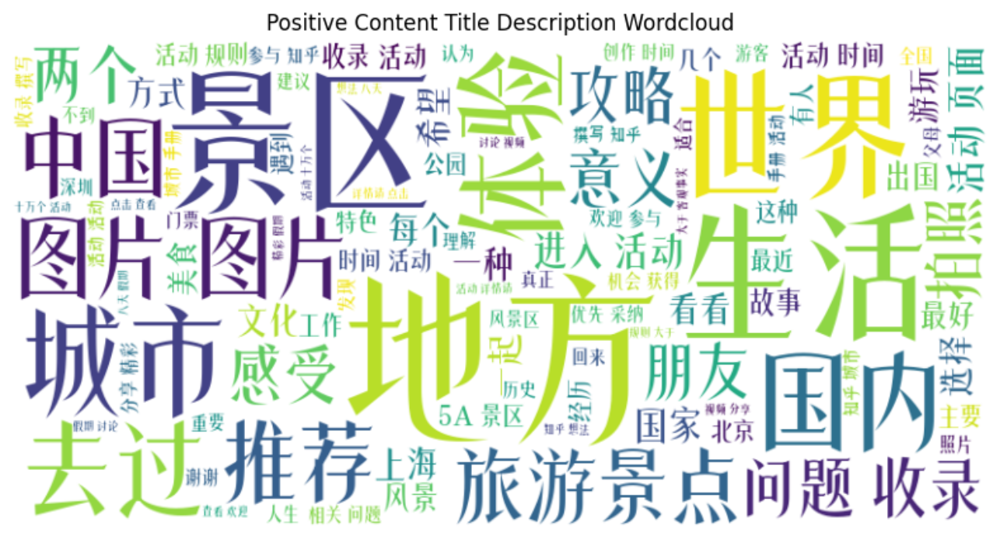

In [23]:
from IPython.display import Image, display
display(Image(filename="C:/Users/86187/Downloads/postive content title description wordcloud.png"))
display(Image(url="https://example.com/image.jpg"))

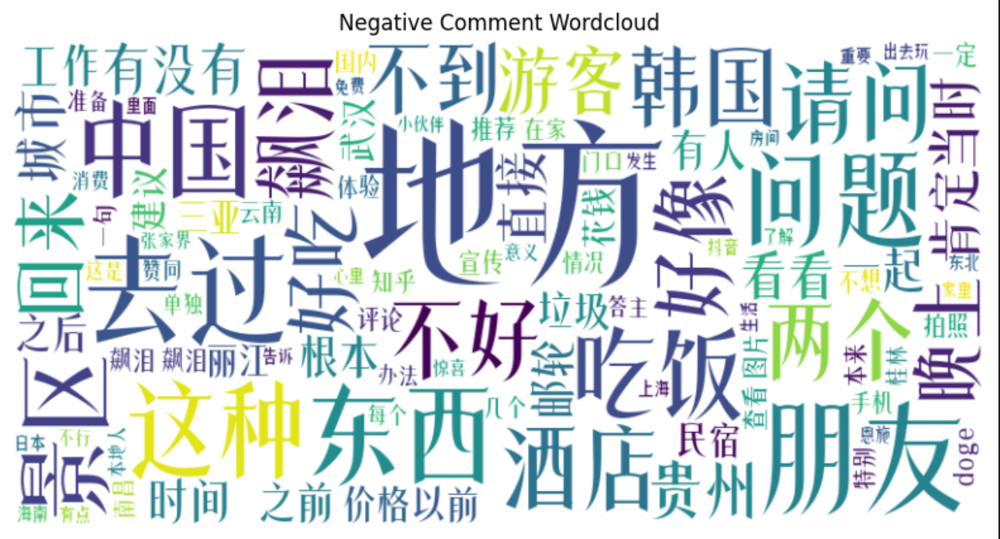

In [25]:
display(Image(filename="C:/Users/86187/Downloads/Negative comment wordcloud.png"))
display(Image(url="https://example.com/image.jpg"))

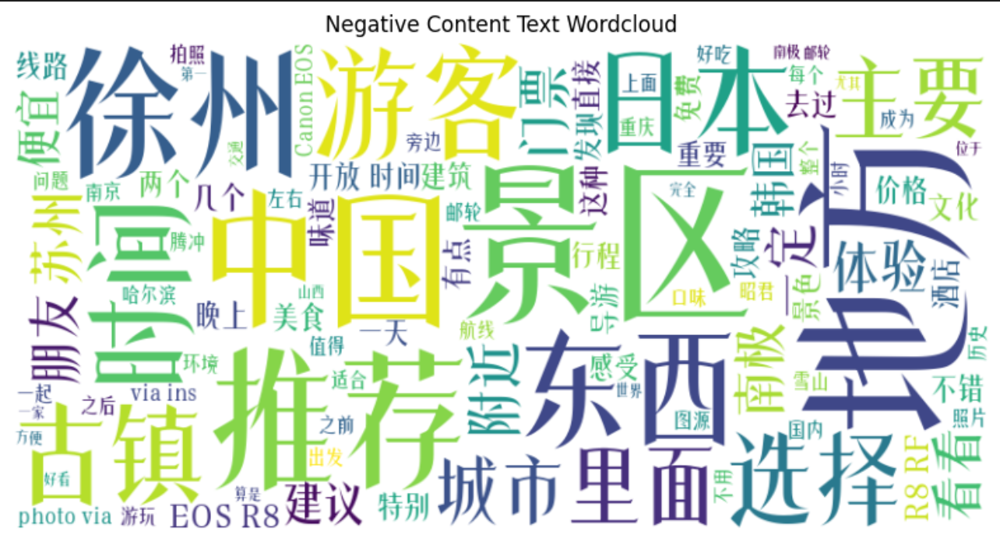

In [27]:
display(Image(filename="C:/Users/86187/Downloads/negative content text wordcloud.png"))
display(Image(url="https://example.com/image.jpg"))

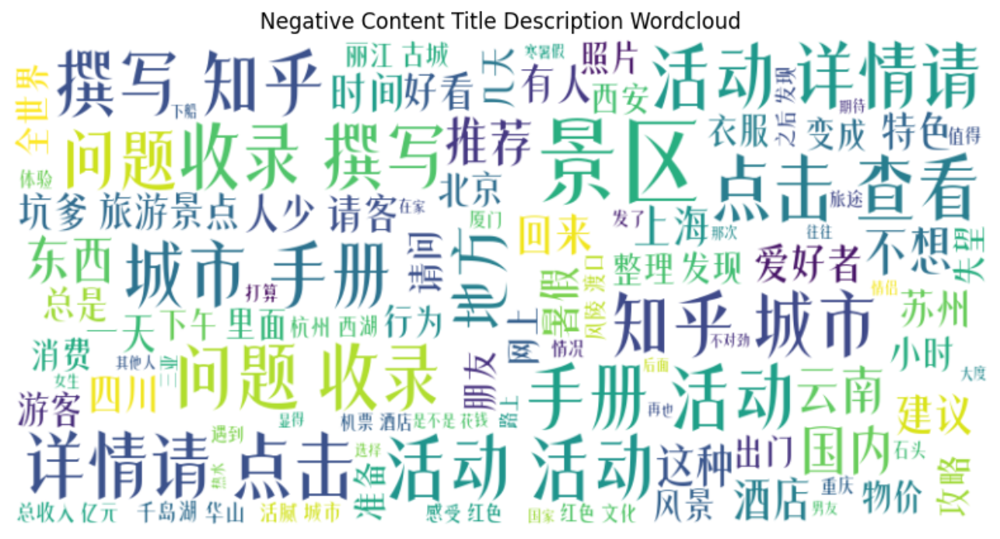

In [31]:
display(Image(filename="C:/Users/86187/Downloads/negative content title description wordcloud.png"))
display(Image(url="https://example.com/image.jpg"))

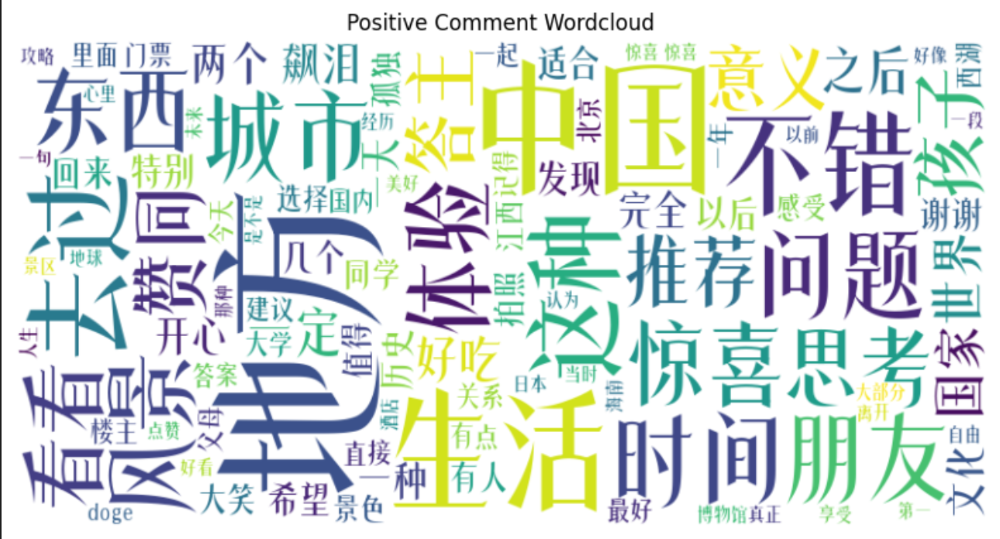

In [28]:
display(Image(filename="C:/Users/86187/Downloads/positive comment wordcloud.png"))
display(Image(url="https://example.com/image.jpg"))

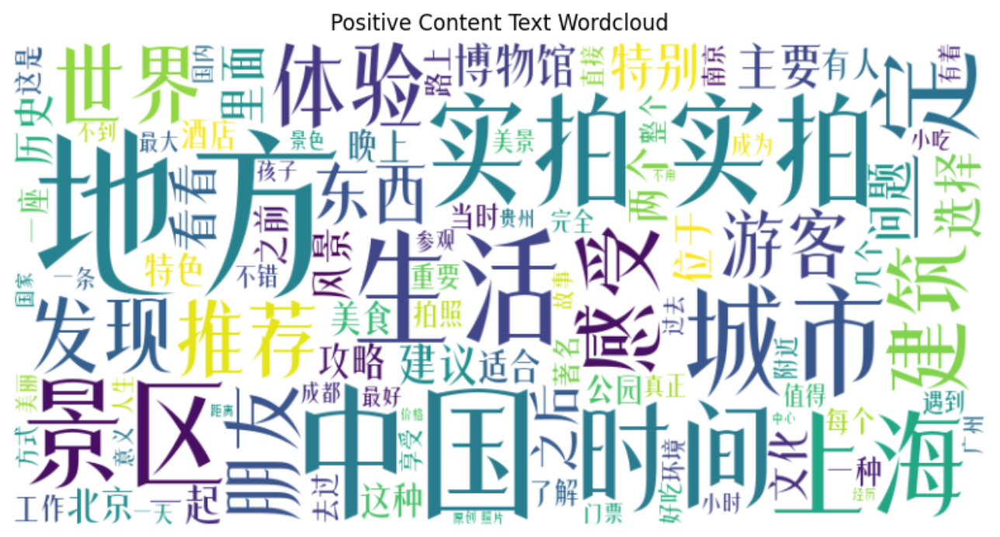

In [29]:
display(Image(filename="C:/Users/86187/Downloads/positive content text wordcloud.png"))
display(Image(url="https://example.com/image.jpg"))

##  Clustering analysis

Through clustering analysis, we first cleaned the data by removing irrelevant information and transformed the text into high-dimensional numerical representations. Based on silhouette scores, we evaluated the effectiveness of different numbers of clusters and segmented the text into distinct thematic or sentiment clusters, enabling the analysis of underlying patterns or classifications in the content.

['丈夫' '上上下下' '上交' '上升' '上午' '上半年' '上发' '上头' '上学' '上山' '上带' '上查' '上榜' '上次'
 '上海' '上班' '上瘾' '上网' '上路' '上车' '上述' '上面' '下个' '下午' '下去' '下图' '下头' '下山'
 '下来' '下次']


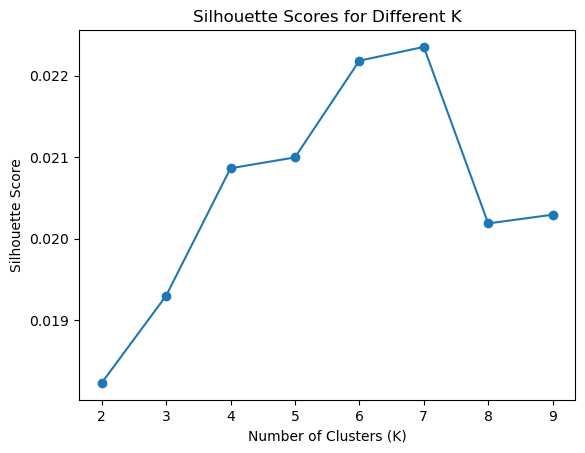

,text,cluster
0,问题 清楚 起因 前两天 父母 海南 特别 根本 放松 身心 花钱买 罪受 每天 早上 睡醒...,6
1,成功 书籍 提到 成功 书籍 有没有 每年 至少 两次 打开 视野 格局 帮助 向上 社交 ...,6
2,寒暑假 远途 感谢 答主 回答 不才 处世之道 修炼 文字 功底 加强 手动 表情 膜拜,6
3,,6
4,作家 列出 富有 传奇色彩 轶事 证据 说明 改变 人生 事情 伊利莎白 吉尔伯特 著作 美...,6


In [17]:
# input: desc & comment
texts = contents_df['desc'].dropna().tolist() + comments_df['content'].dropna().tolist()
stopwords = load_stopwords("cn_stopwords.txt")
chinese_digits = ["一", "二", "三", "四", "五", "六", "七", "八", "九", "十","百","千","万"]

def preprocess_text(text):
    # remove digits
    text = re.sub(r'\d+', '', text)
    # remove EN
    text = re.sub(r'[a-zA-Z]+', '', text)
    words = jieba.cut(text)
    # remove CN digits
    words = [word for word in words if not any(digit in word for digit in chinese_digits)]
    return " ".join(word for word in words if word not in stopwords and len(word) > 1)

texts = [preprocess_text(word) for word in texts]

# initialize TF-IDF
tfidf = TfidfVectorizer(max_features=5000)

# TF-IDF feature matrix
text_features = tfidf.fit_transform(texts)

# feature words
feature_names = tfidf.get_feature_names_out()
print(feature_names[:30])

# k
sil_scores = []
k_values = range(2, 10)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(text_features)
    sil_scores.append(silhouette_score(text_features, labels))

# visualization
plt.plot(k_values, sil_scores, marker='o')
plt.title("Silhouette Scores for Different K")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.show()

# best k
best_k = k_values[sil_scores.index(max(sil_scores))]
kmeans = KMeans(n_clusters=best_k, random_state=42)
clusters = kmeans.fit_predict(text_features)

clustered_texts = pd.DataFrame({'text': texts, 'cluster': clusters})
clustered_texts.head()

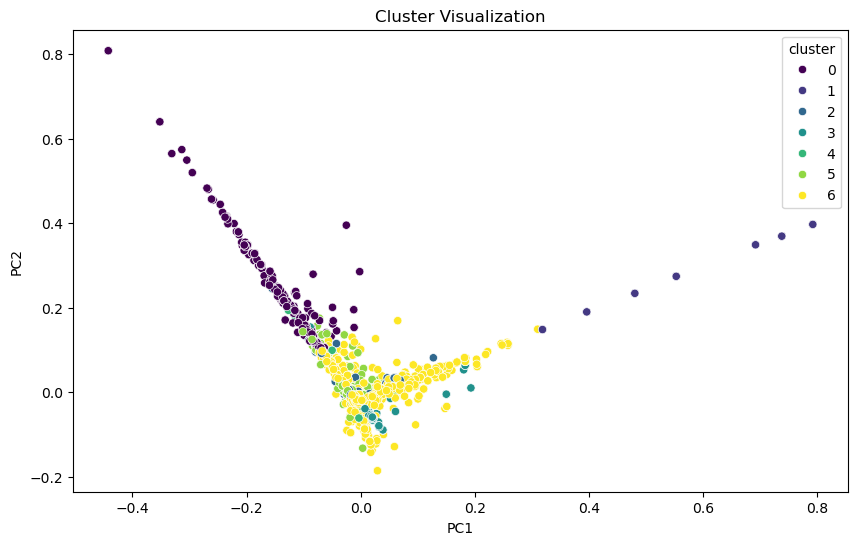

In [18]:
# PCA
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(text_features.toarray())
reduced_cluster_df = pd.DataFrame(reduced_features, columns=["PC1", "PC2"])
reduced_cluster_df["cluster"] = clusters

plt.figure(figsize=(10, 6))
sns.scatterplot(data=reduced_cluster_df, x="PC1", y="PC2", hue="cluster", palette="viridis")
plt.title("Cluster Visualization")
plt.show()

The data has been reduced to two principal components (PC1 and PC2) using PCA (Principal Component Analysis), which extracts the main variance information from the features. The X-axis represents the first principal component (PC1), and the Y-axis represents the second principal component (PC2). This visualization represents the dimensionality reduction and clustering results of textual data (provided by the `text_features` dataset), where different clusters may correspond to different text topics or categories. The principal components PC1 and PC2 explain most of the variance in the original data, thus effectively reflecting the primary structure of the data in the plot. By reducing high-dimensional data to two dimensions, this visualization clearly displays the clustering results and the relationships between different clusters.

# Regression & Modeling

In [19]:
# sub comment count sum by content id
sub_comment_sum = comments_df.groupby('content_id')['sub_comment_count'].sum().reset_index()
contents_df = contents_df.merge(sub_comment_sum, on='content_id', how='left')

In [20]:
# input feature: voteup count, comment count, sub comment count; target: desc_sentiment
features = ['voteup_count', 'comment_count', 'sub_comment_count']
target = 'desc_sentiment'

data = contents_df[features + [target]].dropna()

# split into training 80%/test 20%
X = data[features]
y = data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [21]:
# randomforest
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)


In [22]:
# Accuracy
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R² Score: {r2}')


Mean Squared Error: 0.05076111085176401
R² Score: 0.577894492042601


The model demonstrates moderate predictive capability (R² = 0.5779), indicating that it can partially predict the sentiment value of content based on the number of likes, comments, and sub-comments. The MSE value is 0.05076, which is relatively low, suggesting that the deviation between predicted and actual values is limited.

However, the R² value is not close to 1, meaning that 42.2% of the sentiment value's variation remains unexplained by the current features. This indicates the potential need to incorporate additional relevant features, such as content length or keywords.

There is a certain correlation between the number of likes, comments, and sub-comments and sentiment values. The model can help identify which content is more likely to elicit a positive emotional response.

# Conclusion
Our study focuses on the topics of travel on Chinese social platforms, employing advanced analytical tools and methods to delve into the cultural and emotional dimensions of travel discourse. By concentrating on user-generated content (UGC) from the renowned Q&A platform Zhihu and utilizing SnowNLP for sentiment analysis, we examined the evolution of travelers' perceptions, preferences, and emotional feedback between 2011 and 2024.

We found that over this 14-year span, positive emotional trends exhibited a significant upward trajectory, while negative emotions markedly decreased. By 2024, sentiment was almost entirely dominated by positivity, whereas certain years, such as 2021, showed more pronounced emotional polarization. The rise in positive sentiment reflects travelers' growing satisfaction with and trust in online information.

UGC demonstrates immense value in understanding tourist behavior and preferences. Sentiment distribution across content and comments shows that positive emotions dominate, with negative emotions being relatively rare. This finding further validates the critical role of social media platforms in shaping and reflecting travelers' perceptions. Cultural and natural attractions were frequently mentioned in UGC discussions, aligning with existing taxonomies of tourist attractions. Cluster analysis revealed distinct themes and emotional patterns, highlighting varying emphases on experiences such as natural landscapes, cultural heritage, and urban exploration. Analysis of engagement metrics, including likes and comments, indicated a steady annual increase in user interaction. The correlation between sentiment scores and engagement data underscores the significant impact of emotional appeal on content popularity. Our findings further confirm the cultural dimension's influence on travel behavior. UGC reveals that collectivist cultures (e.g., Chinese tourists) tend to favor socially appealing popular attractions, while individualist cultures (e.g., Western tourists) prefer diverse and independent experiences.

Although the predictive accuracy of the model is moderate (R² = 0.5779), the results suggest that engagement metrics such as likes, comments, and sub-comments can partially predict sentiment scores. The relatively low mean squared error (MSE = 0.05076) indicates limited bias in the model, but incorporating additional features (e.g., content length or thematic keywords) offers potential for improvement.

Based on our findings, we propose several recommendations. The upward trend in positive sentiment suggests the potential to leverage UGC in promotional activities. Tourism agencies and destination marketers can use these insights to design promotional content that aligns with travelers' emotional preferences. Understanding how different cultures influence travel behavior can help destinations provide more personalized experiences. For example, collectivist travelers may prefer group activities, while individualist travelers might favor free exploration or adventure experiences. In the future, introducing more features (e.g., linguistic nuances, visual data, and real-time engagement metrics) to optimize predictive models will provide deeper insights into emotional dynamics. In summary, this study reveals the complex interplay between cultural influences, emotional dimensions, and UGC in shaping travel discourse. These findings not only provide theoretical support for understanding how digital platforms reflect and influence travel experiences but also offer significant reference value for tourism research and practice.

## References
Alaei, A. R., Becken, S., & Stantic, B. (2019). Sentiment Analysis in Tourism: Capitalizing on Big Data. Journal of Travel Research, 58(2), 175–191. https://doi.org/10.1177/0047287517747753

Chang, R. C. Y., Kivela, J., & Mak, A. H. N. (2011). Attributes that influence the evaluation of travel dining experience: When East meets West. Tourism Management, 32(2), 307–316. https://doi.org/10.1016/j.tourman.2010.02.009
Del Chiappa, G., Lorenzo-Romero, C., & Alarcón-del-Amo, M.-C. (2015). The Influence of User-Generated Content on Tourists’ Choices. Market-Tržište, 27(2), 221–236.

Garner, B., & Kim, D. (2022). Analyzing user-generated content to improve customer satisfaction at local wine tourism destinations: An analysis of Yelp and TripAdvisor reviews. Consumer Behavior in Tourism and Hospitality, 17(4), 413–435. https://doi.org/10.1108/CBTH-03-2022-0077

Hofstede, G. (2011). Dimensionalizing Cultures: The Hofstede Model in Context. Online Readings in Psychology and Culture, 2(1). https://doi.org/10.9707/2307-0919.1014

Jia, M., Feng, J., Chen, Y., & Zhao, C. (2024). Visual Analysis of Social Media Data on Experiences at a World Heritage Tourist Destination: Historic Centre of Macau. Buildings, 14(7), Article 7. https://doi.org/10.3390/buildings14072188

Koc, E. (2020). Cross-Cultural Aspects of Tourism and Hospitality: A Services Marketing and Management Perspective. Routledge. https://doi.org/10.4324/9781003018193

Kumar, N., & Hanji, B. R. (2024). Combined sentiment score and star rating analysis of travel destination prediction based on user preference using morphological linear neural network model with correlated topic modelling approach. Multimedia Tools and Applications, 83(22), 61347–61378. https://doi.org/10.1007/s11042-023-17995-y

Leiper, N. (1990). Tourist attraction systems. Annals of Tourism Research, 17(3), 367–384. https://doi.org/10.1016/0160-7383(90)90004-B

Lew, A. A. (1987). A framework of tourist attraction research. Annals of Tourism Research, 14(4), 553–575. https://doi.org/10.1016/0160-7383(87)90071-5

Lozano-Monterrubio, N., & Huertas, A. (2020). The image of Barcelona in Online Travel Reviews during 2017 Catalan independence process. https://repositorio.consejodecomunicacion.gob.ec//handle/CONSEJO_REP/2514

Mariani, M. M., Borghi, M., & Okumus, F. (2020). Unravelling the effects of cultural differences in the online appraisal of hospitality and tourism services. International Journal of Hospitality Management, 90, 102606. https://doi.org/10.1016/j.ijhm.2020.102606

Oliveira, T., Araujo, B., & Tam, C. (2020). Why do people share their travel experiences on social media? Tourism Management, 78, 104041. https://doi.org/10.1016/j.tourman.2019.104041

Qiu, Q., & Zhang, M. (2021). Using Content Analysis to Probe the Cognitive Image of Intangible Cultural Heritage Tourism: An Exploration of Chinese Social Media. ISPRS International Journal of Geo-Information, 10(4), Article 4. https://doi.org/10.3390/ijgi10040240

Richards, G. (2002). Tourism attraction systems: Exploring Cultural Behavior. Annals of Tourism Research, 29(4), 1048–1064. https://doi.org/10.1016/S0160-7383(02)00026-9

Sánchez-Franco, M. J., & Rey-Tienda, S. (2023). The role of user-generated content in tourism decision-making: An exemplary study of Andalusia, Spain. Management Decision, 62(7), 2292–2328. https://doi.org/10.1108/MD-06-2023-0966

Santos, M. L. B. dos. (2021). The “so-called” UGC: An updated definition of user-generated content in the age of social media. Online Information Review, 46(1), 95–113. https://doi.org/10.1108/OIR-06-2020-0258

Stepchenkova, S., Kim, H., & Kirilenko, A. (2015). Cultural Differences in Pictorial Destination Images: Russia through the Camera Lenses of American and Korean Tourists. Journal of Travel Research, 54(6), 758–773. https://doi.org/10.1177/0047287514535849

Wen, Y., Liang, Y., & Zhu, X. (2023). Sentiment analysis of hotel online reviews using the BERT model and ERNIE model—Data from China. PLOS ONE, 18(3), e0275382. https://doi.org/10.1371/journal.pone.0275382

Xu, H., Cheung, L. T. O., Lovett, J., Duan, X., Pei, Q., & Liang, D. (2023). Understanding the influence of user-generated content on tourist loyalty behavior in a cultural World Heritage Site. Tourism Recreation Research, 48(2), 173–187. https://doi.org/10.1080/02508281.2021.1913022

Yadollahi, A., Shahraki, A. G., & Zaiane, O. R. (2017). Current State of Text Sentiment Analysis from Opinion to Emotion Mining. ACM Comput. Surv., 50(2), 25:1-25:33. https://doi.org/10.1145/3057270

Yang, B.-E., & Brown, T. J. (1992). A Cross-Cultural Comparison of Preferences for Landscape Styles and Landscape Elements. Environment and Behavior, 24(4), 471–507. https://doi.org/10.1177/0013916592244003
